# Embryoid body development - CytoTRACE-based analysis

Construct CytoTRACE score for embryoid body development and analyse data with the _CytoTRACEKernel_.

## Library imports

In [1]:
import sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import cellrank as cr
import scanpy as sc
import scvelo as scv

from cr2 import get_state_purity, plot_state_purity, running_in_notebook

sys.path.extend(["../../../", "."])
from paths import DATA_DIR, FIG_DIR  # isort: skip  # noqa: E402

Global seed set to 0


## General settings

In [2]:
sc.settings.verbosity = 2
cr.settings.verbosity = 4
scv.settings.verbosity = 3

In [3]:
scv.settings.set_figure_params("scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map="viridis")

In [4]:
SAVE_FIGURES = False
if SAVE_FIGURES:
    (FIG_DIR / "cytotrace_kernel" / "embryoid_body").mkdir(parents=True, exist_ok=True)

FIGURE_FORMAT = "pdf"

## Data loading

In [5]:
adata = sc.read(DATA_DIR / "embryoid_body" / "embryoid_body.h5ad")
adata

AnnData object with n_obs × n_vars = 31029 × 19122
    obs: 'stage', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

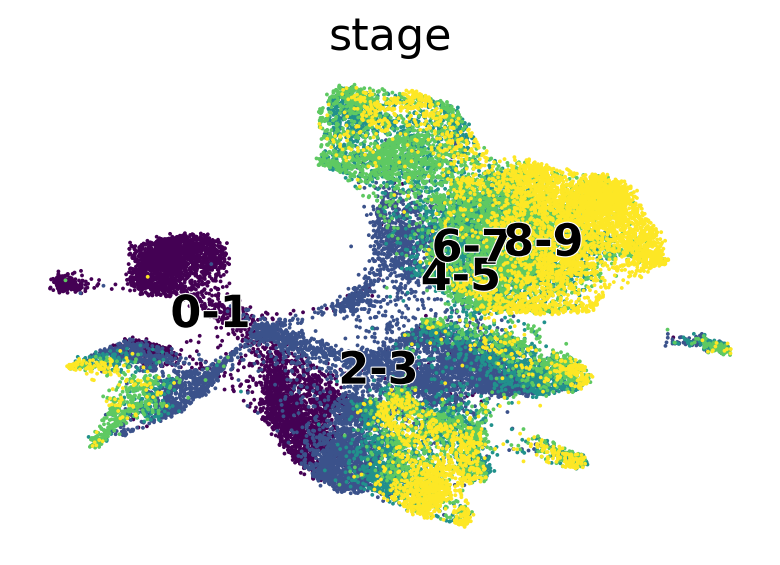

In [6]:
if running_in_notebook():
    scv.pl.scatter(adata, basis="umap", c="stage", palette="viridis")

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", c="stage", title="", legend_loc=False, palette="viridis", ax=ax)
    fig.savefig(
        FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"umap_colored_by_stage.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )

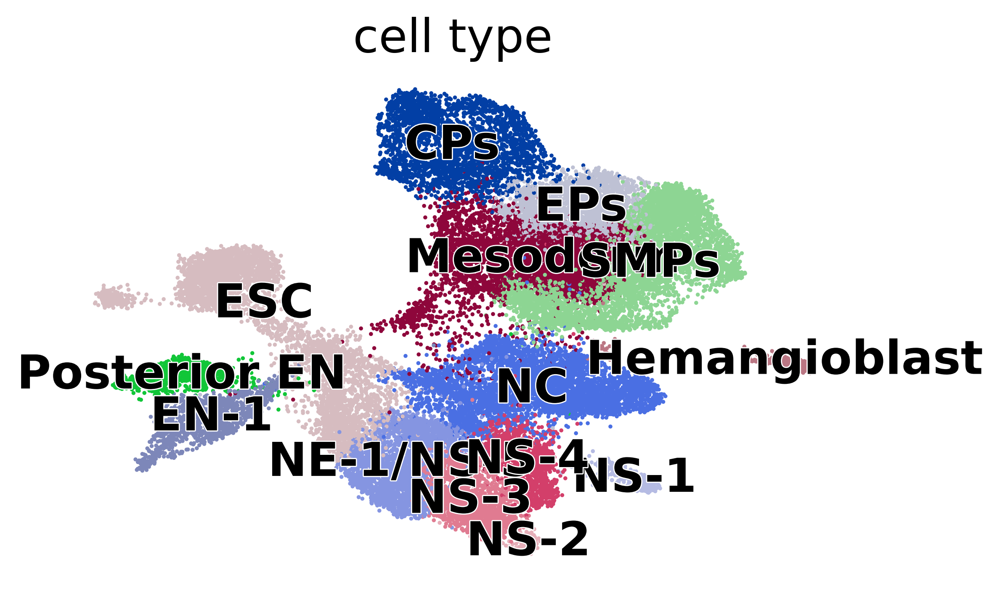

In [7]:
if running_in_notebook():
    scv.pl.scatter(adata, basis="umap", c="cell_type", dpi=200)

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(adata, basis="umap", c="cell_type", title="", legend_loc=False, ax=ax)
    fig.savefig(
        FIG_DIR / "cytotrace_kernel" / "embryoid_body" / "umap_colored_by_cell_type.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )

## Data preprocessing

In [8]:
adata.layers["spliced"] = adata.X
adata.layers["unspliced"] = adata.X

scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

computing moments based on connectivities
    finished (0:00:38) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


## CellRank

### Kernel

In [9]:
ctk = cr.kernels.CytoTRACEKernel(adata)
ctk.compute_cytotrace()

Computing CytoTRACE score with `19122` genes
DEBUG: Correlating all genes with number of genes expressed per cell
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `adata.obs['ct_num_exp_genes']`
       `adata.var['ct_gene_corr']`
       `adata.var['ct_correlates']`
       `adata.uns['ct_params']`
    Finish (0:00:01)


CytoTRACEKernel[n=31029]

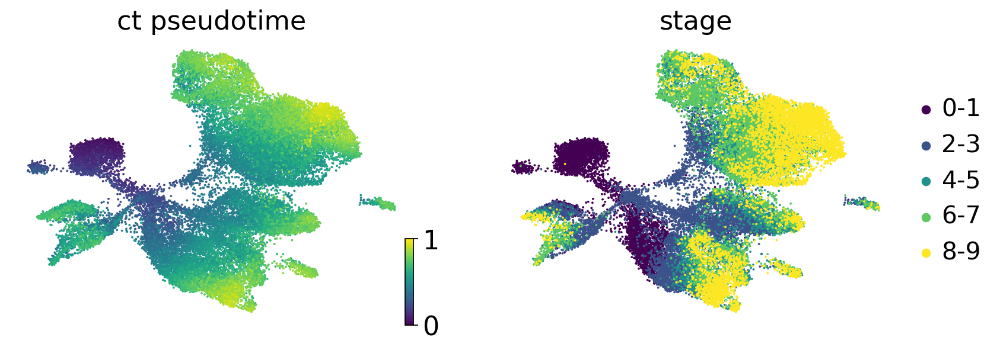

In [10]:
if running_in_notebook():
    scv.pl.scatter(
        adata,
        c=["ct_pseudotime", "stage"],
        basis="umap",
        legend_loc="right",
        color_map="viridis",
    )

if SAVE_FIGURES:
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.scatter(
        adata, basis="umap", c="ct_pseudotime", title="", colorbar=False, color_map="gnuplot2", show=False, ax=ax
    )

    fig.savefig(
        FIG_DIR / "cytotrace_kernel" / "embryoid_body" / "umap_colored_by_ct_pseudotime.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )

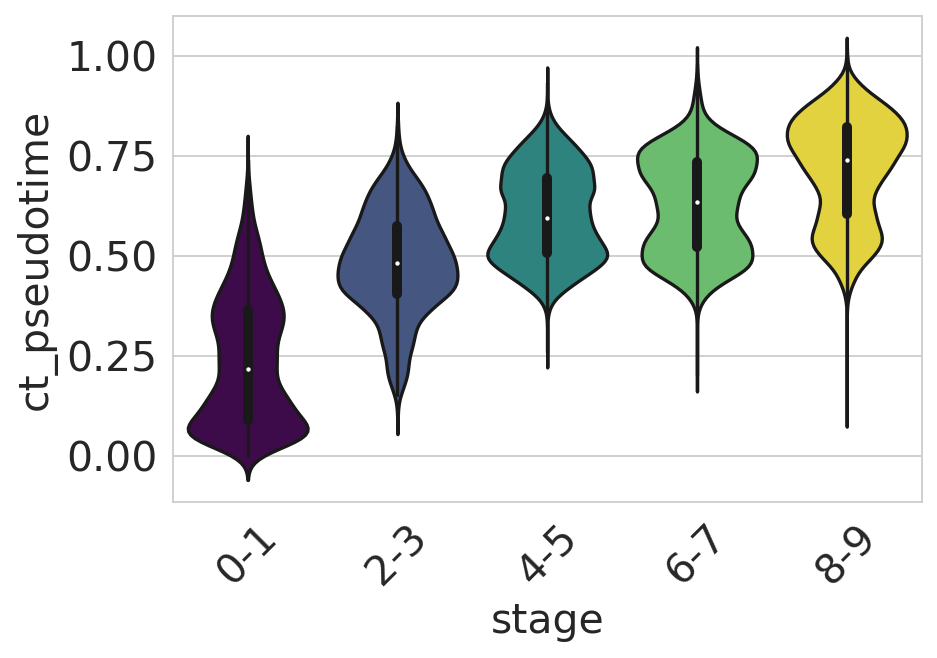

In [11]:
df = adata.obs[["ct_pseudotime", "stage"]].copy()

if running_in_notebook():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.violinplot(
        data=df,
        x="stage",
        y="ct_pseudotime",
        scale="width",
        palette=["#440154", "#3b528b", "#21918c", "#5ec962", "#fde725"],
        ax=ax,
    )

    ax.tick_params(axis="x", rotation=45)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1])
    plt.show()
    sns.reset_orig()

if SAVE_FIGURES:
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.violinplot(
        data=df,
        x="stage",
        y="ct_pseudotime",
        scale="width",
        palette=["#440154", "#3b528b", "#21918c", "#5ec962", "#fde725"],
        ax=ax,
    )
    ax.set(xlabel=None, xticklabels=[], ylabel=None, yticklabels=[])

    fig.savefig(
        FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"cytotrace_vs_stage.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )
    sns.reset_orig()

In [12]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)

Computing transition matrix based on pseudotime


  0%|          | 0/31029 [00:00<?, ?cell/s]

    Finish (0:00:20)


CytoTRACEKernel[n=31029, dnorm=False, scheme='soft', b=10.0, nu=0.5]

### Estimator

Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


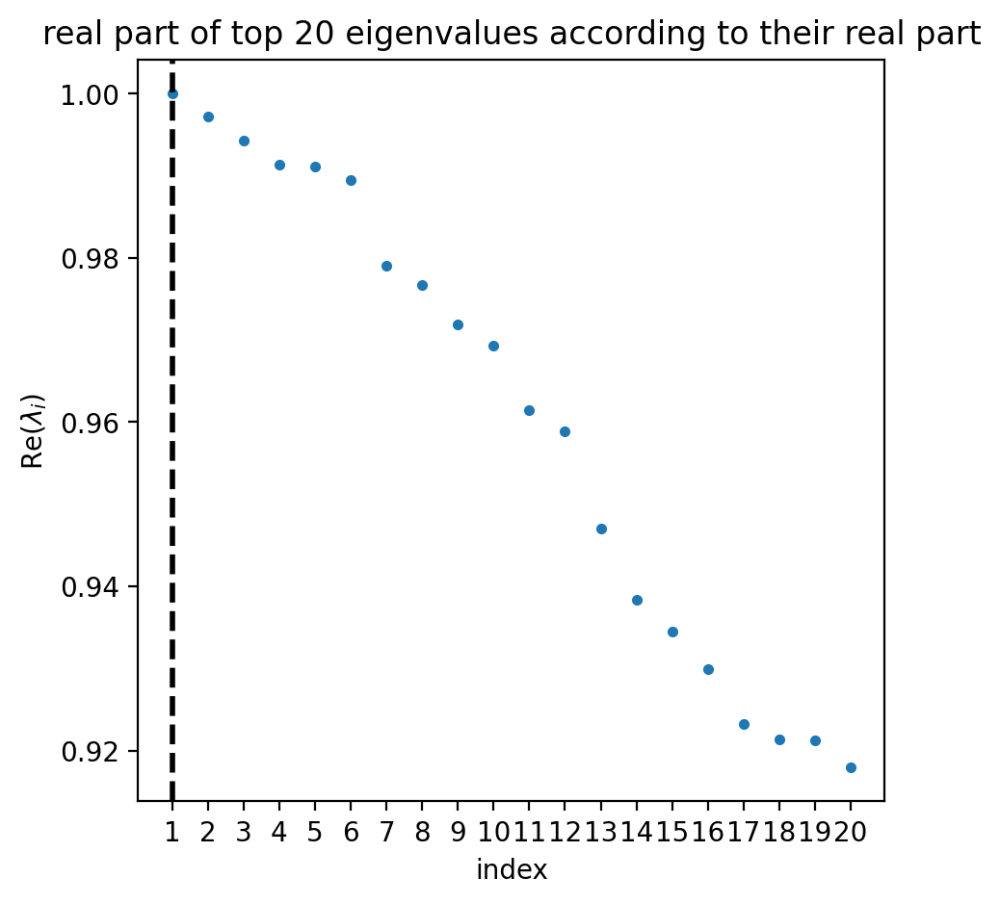

In [13]:
estimator = cr.estimators.GPCCA(ctk)
estimator.compute_schur(n_components=20)
if running_in_notebook():
    estimator.plot_spectrum(real_only=True)
    plt.show()

Computing `20` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:08:27)


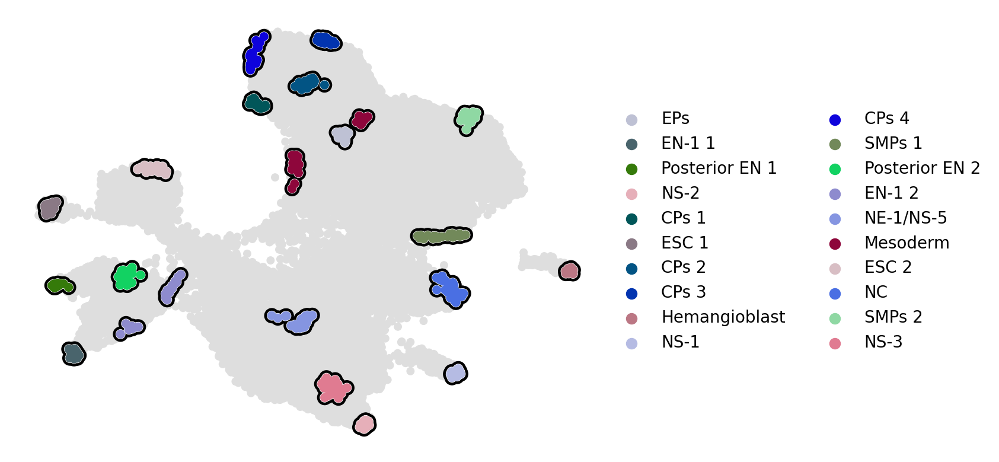

In [14]:
estimator.compute_macrostates(20, cluster_key="cell_type")

if running_in_notebook():
    estimator.plot_macrostates(which="all", basis="umap", legend_loc="right", title="", size=100)
    if SAVE_FIGURES:
        fpath = (
            FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"umap_colored_by_cytotrace_macrostates.{FIGURE_FORMAT}"
        )
        estimator.plot_macrostates(which="all", basis="umap", title="", legend_loc=False, size=100, save=fpath)

Mean purity: 0.9683333333333334


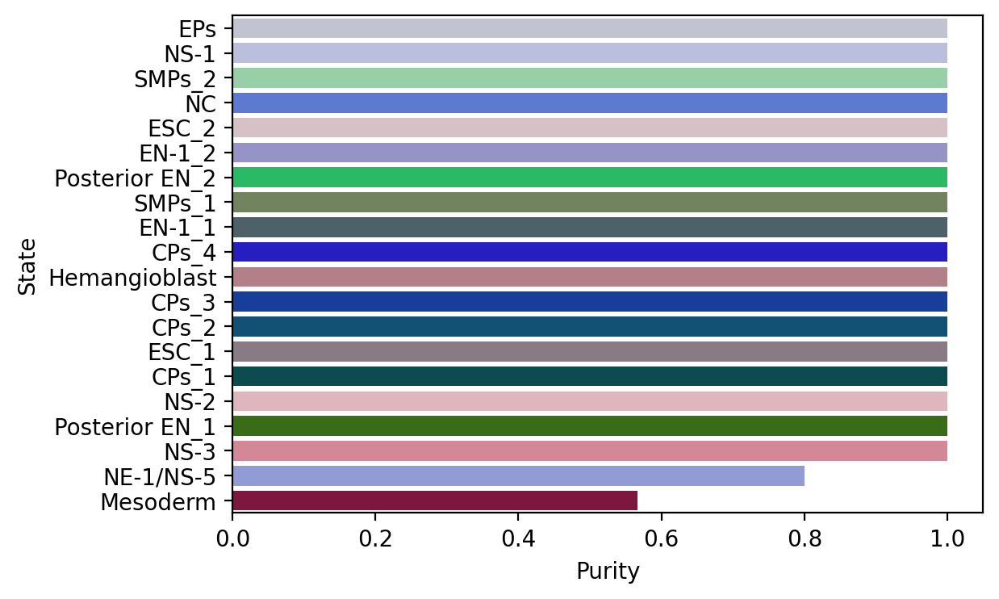

In [15]:
macrostate_purity = get_state_purity(adata, estimator, states="macrostates", obs_col="cell_type")
print(f"Mean purity: {np.mean(list(macrostate_purity.values()))}")

if running_in_notebook():
    if SAVE_FIGURES:
        fpath = FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"cytotrace_macrostate_purity.{FIGURE_FORMAT}"
    else:
        fpath = None

    palette = dict(zip(estimator.macrostates.cat.categories, estimator._macrostates.colors))

    plot_state_purity(macrostate_purity, palette=palette, fpath=fpath, format=FIGURE_FORMAT)
    plt.show()

DEBUG: Raising an exception if there are less than `6` cells.
Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


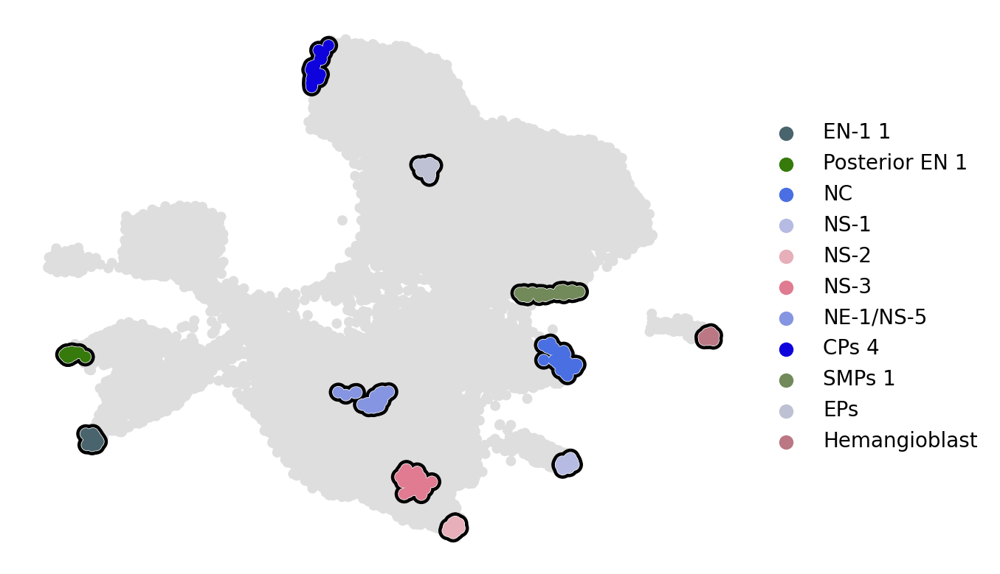

In [16]:
estimator.set_terminal_states(
    [
        "EN-1_1",
        "Posterior EN_1",
        "NC",
        "NS-1",
        "NS-2",
        "NS-3",
        "NE-1/NS-5",
        "CPs_4",
        "SMPs_1",
        "EPs",
        "Hemangioblast",
    ]
)

if running_in_notebook():
    estimator.plot_macrostates(which="terminal", basis="umap", legend_loc="right", title="", size=100)
    if SAVE_FIGURES:
        fpath = (
            FIG_DIR
            / "cytotrace_kernel"
            / "embryoid_body"
            / f"umap_colored_by_cytotrace_terminal_states.{FIGURE_FORMAT}"
        )
        estimator.plot_macrostates(which="terminal", basis="umap", title="", legend_loc=False, size=100, save=fpath)

Mean purity: 0.9818181818181819


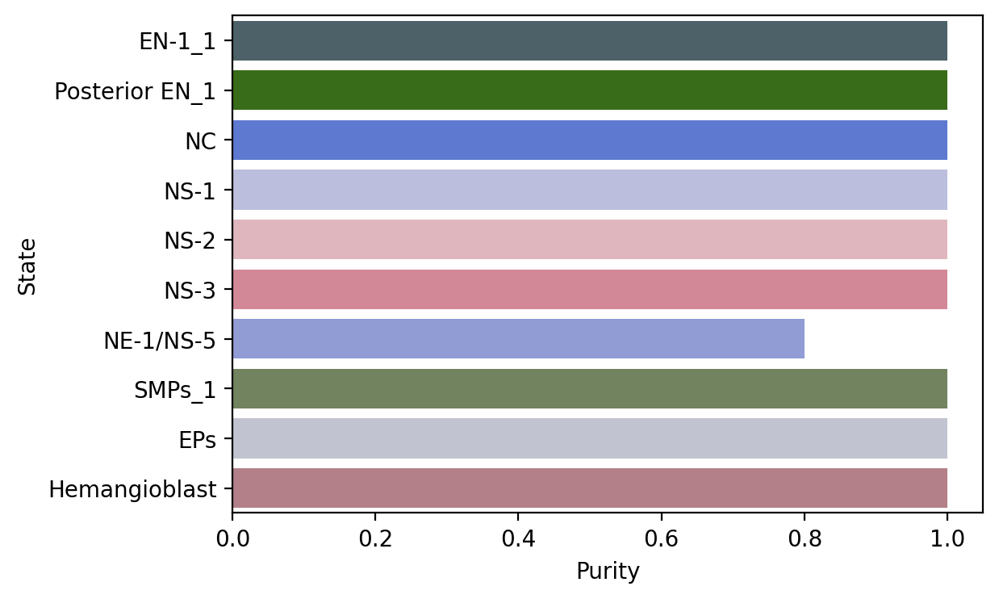

In [17]:
macrostate_purity = get_state_purity(adata, estimator, states="terminal_states", obs_col="cell_type")
print(f"Mean purity: {np.mean(list(macrostate_purity.values()))}")

if running_in_notebook():
    if SAVE_FIGURES:
        fpath = FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"cytotrace_terminal_states_purity.{FIGURE_FORMAT}"
    else:
        fpath = None

    palette = dict(zip(estimator.terminal_states.cat.categories, estimator._term_states.colors))

    plot_state_purity(
        macrostate_purity,
        palette=palette,
        order=["EN-1_1", "Posterior EN_1", "NC", "NS-1", "NS-2", "NS-3", "NE-1/NS-5", "SMPs_1", "EPs", "Hemangioblast"],
        fpath=fpath,
        format=FIGURE_FORMAT,
    )
    plt.show()

Computing fate probabilities
DEBUG: Solving the linear system using `PETSc` solver `'gmres'` on `1` core(s) with no preconditioner and `tol=1e-07`


  0%|          | 0/11 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:02)


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: 

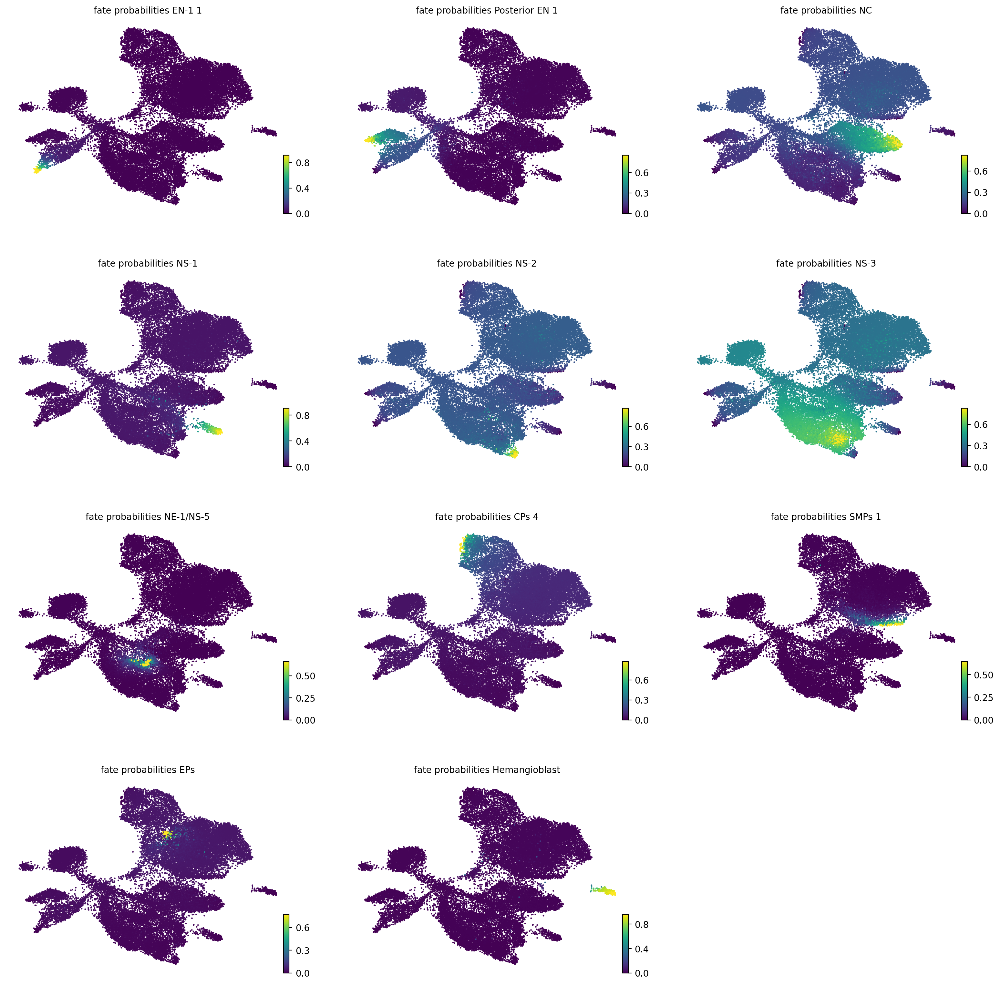

In [18]:
estimator.compute_fate_probabilities(tol=1e-7)
if running_in_notebook():
    estimator.plot_fate_probabilities(same_plot=False, basis="umap", ncols=3)

if SAVE_FIGURES:
    for terminal_state in estimator.terminal_states.cat.categories:
        adata.obs[f"fate_prob_{terminal_state}"] = adata.obsm["lineages_fwd"][:, terminal_state].X.squeeze()
        fig, ax = plt.subplots(figsize=(6, 4))

        if running_in_notebook():
            scv.pl.scatter(
                adata,
                basis="umap",
                color=f"fate_prob_{terminal_state}",
                cmap="viridis",
                title="",
                colorbar=False,
                ax=ax,
            )

            fig.savefig(
                FIG_DIR
                / "cytotrace_kernel"
                / "embryoid_body"
                / f"cytotrace_fate_prob_{terminal_state}.{FIGURE_FORMAT}",
                format=FIGURE_FORMAT,
                transparent=True,
                bbox_inches="tight",
            )

### Driver analysis

DEBUG: Computing correlations for lineages `['EN-1_1']` restricted to clusters `['ESC']` in layer `X` with `use_raw=False`
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


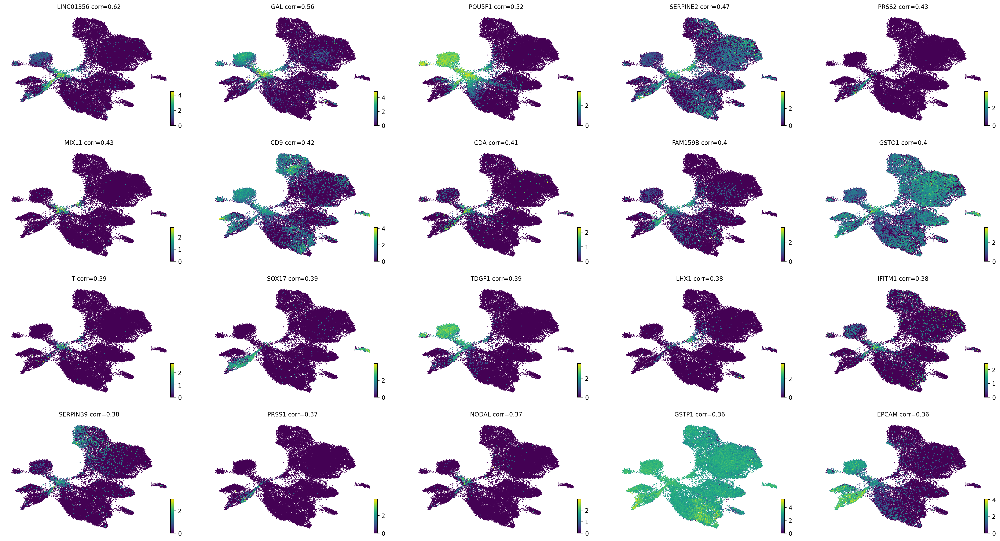

In [19]:
drivers_en_1 = estimator.compute_lineage_drivers(
    return_drivers=True, cluster_key="cell_type", lineages=["EN-1_1"], clusters=["ESC"]
)

if running_in_notebook():
    estimator.plot_lineage_drivers(lineage="EN-1_1", n_genes=20, ncols=5, title_fmt="{gene} corr={corr:.2}")
    plt.show()

In [20]:
if SAVE_FIGURES:
    for var_name in ["FOXA2", "SOX17"]:
        fig, ax = plt.subplots(figsize=(6, 4))
        scv.pl.scatter(adata, basis="umap", color=var_name, ax=ax)

        fig.savefig(
            FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"umap_colored_by_{var_name.lower()}.{FIGURE_FORMAT}",
            format=FIGURE_FORMAT,
            transparent=True,
            bbox_inches="tight",
        )

In [21]:
human_tfs = pd.read_csv(DATA_DIR / "generic" / "human_tfs.csv", index_col=0)["HGNC symbol"].str.lower().values

n_top_genes_tfs = (
    adata.varm["terminal_lineage_drivers"]["EN-1_1_corr"]
    .sort_values(ascending=False)
    .index[:50]
    .str.lower()
    .isin(human_tfs)
    .sum()
)
print(f"Number of TFs in top 50 genes: {n_top_genes_tfs}")

Number of TFs in top 50 genes: 13


Computing trends using `1` core(s)


  0%|          | 0/50 [00:00<?, ?gene/s]

    Finish (0:00:11)
DEBUG: Plotting `'lineages'` heatmap


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


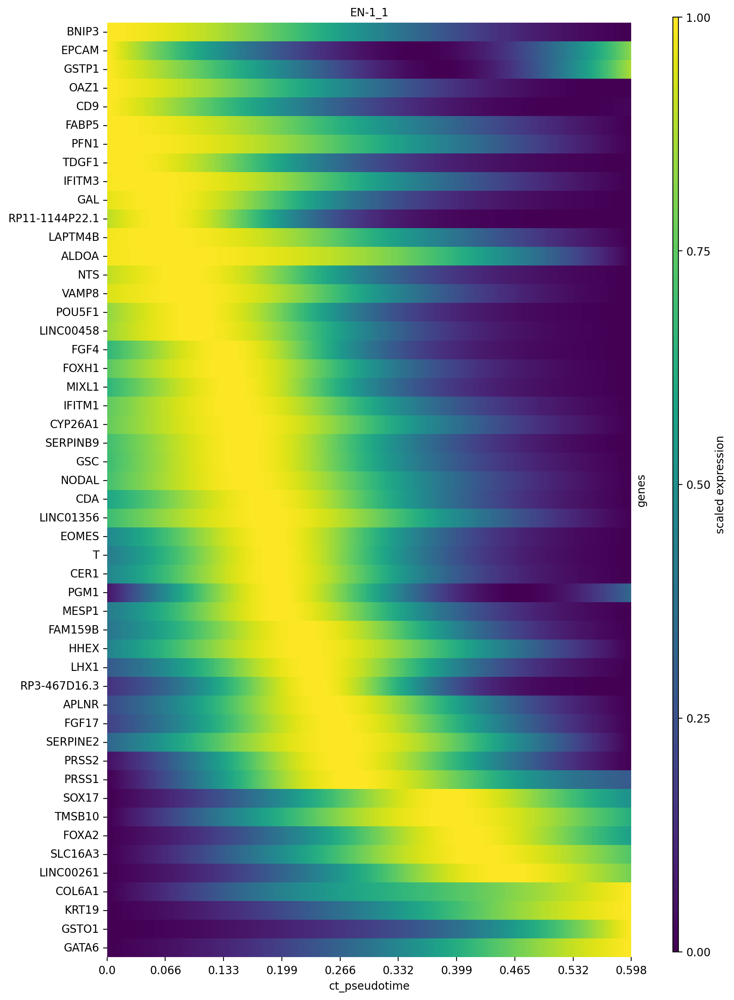

In [22]:
model = cr.models.GAM(adata)

if SAVE_FIGURES:
    save = FIG_DIR / "cytotrace_kernel" / "embryoid_body" / f"heatmap_en_1_lineage.{FIGURE_FORMAT}"
else:
    save = None

cr.pl.heatmap(
    adata,
    model,
    genes=adata.varm["terminal_lineage_drivers"]["EN-1_1_corr"].sort_values(ascending=False).index[:50],
    show_fate_probabilities=False,
    show_all_genes=True,
    lineages="EN-1_1",
    time_key="ct_pseudotime",
    figsize=(10, 15),
    save=save,
)
plt.show()